#ONLY RGB

In [ ]:
import cv2
import matplotlib.pyplot as plt
import glob

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone repo


Cloning into 'yolov5'...
remote: Enumerating objects: 14461, done.
remote: Counting objects: 100% (90/90), done.
remote: Compressing objects: 100% (50/50), done.
remote: Total 14461 (delta 58), reused 64 (delta 39), pack-reused 14371
Receiving objects: 100% (14461/14461), 13.63 MiB | 15.91 MiB/s, done.
Resolving deltas: 100% (9959/9959), done.


In [ ]:
!pip install -U -r yolov5/requirements.txt  # install dependencies


In [ ]:
%cd yolov5

/content/yolov5


In [ ]:
!ls

benchmarks.py	 data	     LICENSE	      requirements.txt	tutorial.ipynb
CITATION.cff	 detect.py   models	      segment		utils
classify	 export.py   README.md	      setup.cfg		val.py
CONTRIBUTING.md  hubconf.py  README.zh-CN.md  train.py


In [ ]:
import torch
from IPython.display import Image  # for displaying images
# from utils.downloads import gdrive_download  # for downloading models/datasets

print('Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Using torch 1.13.0+cu116 _CudaDeviceProperties(name='A100-SXM4-40GB', major=8, minor=0, total_memory=40536MB, multi_processor_count=108)


In [ ]:
!pwd

/content/yolov5


In [ ]:
#V2 Downloading dataset ()
# !curl -L "https://app.roboflow.com/ds/lKOnuCwhuN?key=w4D87x46sd" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip
!curl -L "https://universe.roboflow.com/ds/2nNJ36KvT1?key=kLR9mab3AY" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

In [ ]:
!pwd

/content/yolov5


In [ ]:
!ls

benchmarks.py	 export.py	      README.zh-CN.md	tutorial.ipynb
CITATION.cff	 hubconf.py	      requirements.txt	utils
classify	 LICENSE	      segment		valid
CONTRIBUTING.md  models		      setup.cfg		val.py
data		 README.dataset.txt   test
data.yaml	 README.md	      train
detect.py	 README.roboflow.txt  train.py


In [ ]:
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 1
names: ['fire']

In [ ]:
# define number of classes based on YAML
# data.yaml contains the information about number of classes and their labels required for this project
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
!ls

benchmarks.py	 export.py	      README.zh-CN.md	tutorial.ipynb
CITATION.cff	 hubconf.py	      requirements.txt	utils
classify	 LICENSE	      segment		valid
CONTRIBUTING.md  models		      setup.cfg		val.py
data		 README.dataset.txt   test
data.yaml	 README.md	      train
detect.py	 README.roboflow.txt  train.py


In [ ]:
# Below we are changing the data configuration for right path to the dataset
%%writetemplate data.yaml

train: ./train/images
val: ./valid/images

nc: 1
names: ['fire']

In [ ]:

%cat data.yaml


train: ./train/images
val: ./valid/images

nc: 1
names: ['fire']


In [ ]:
with open(r'data.yaml') as file:
    # The FullLoader parameter handles the conversion from YAML
    # scalar values to Python the dictionary format
    labels_list = yaml.load(file, Loader=yaml.FullLoader)

    label_names = labels_list['names']

In [ ]:
print("Number of Classes are {}, whose labels are {} for this Object Detection project".format(num_classes,label_names))


Number of Classes are 1, whose labels are ['fire'] for this Object Detection project


In [ ]:
#this is the model configuration we will use for our tutorial 
# yolov5s.yaml contains the configuration of neural network required for training.
# /content/gdrive/MyDrive/Rachana_Bhankur/yolo_v5_project/yolov5_new/src/yolov5/data.yaml
# %cat /content/gdrive/MyDrive/yolov5_new/src/yolov5/models/yolov5s.yaml
%cat models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [ ]:
# import os
# os.chdir('/yolov5')

In [ ]:
!ls

benchmarks.py	 export.py	      README.zh-CN.md	tutorial.ipynb
CITATION.cff	 hubconf.py	      requirements.txt	utils
classify	 LICENSE	      segment		valid
CONTRIBUTING.md  models		      setup.cfg		val.py
data		 README.dataset.txt   test
data.yaml	 README.md	      train
detect.py	 README.roboflow.txt  train.py


In [ ]:
%cd models

/content/yolov5/models


In [ ]:
!ls

common.py	 hub	      segment  yolo.py	     yolov5m.yaml  yolov5s.yaml
experimental.py  __init__.py  tf.py    yolov5l.yaml  yolov5n.yaml  yolov5x.yaml


In [ ]:
# skip this if you have already downloaded the file (best parameters)
!wget https://github.com/nv-thang/Forest-Fire-Detection-YOLOv5/raw/main/models/best.pt

In [ ]:
!ls

best.pt		 hub	      tf.py	    yolov5m.yaml  yolov5x.yaml
common.py	 __init__.py  yolo.py	    yolov5n.yaml
experimental.py  segment      yolov5l.yaml  yolov5s.yaml


In [ ]:
%cd ..

/content/yolov5


In [ ]:
# train yolov5s on Aquarium object detection data for 100 epochs [aroung 1000 epochs for better training and result]
# NOTE: All the images are already pre-processed to 416 x 416 size.
# We will be training for 100 epoch (increase it for better result) with batch size of 80
# data.yaml also contains the information about location of Train and Validation Data. That's how you get the train data.
# the training also requires the configuration of neural network, which is in yolov5s.yaml
# weights will be by-default stored at /content/yolov5/runs/exp2/weights/best.pt
# time its performance
# V1
%%time
!python train.py --img 240 --batch 160 --epochs 10 --data './data.yaml' --cfg ./models/yolov5s.yaml --weights ''

train: weights=, cfg=./models/yolov5s.yaml, data=./data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=160, imgsz=240, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-30-g342fe05 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (A100-SXM4-40GB, 40536MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s

In [ ]:
# Finding the dataset size

!pwd

/content/yolov5


In [ ]:
!ls

benchmarks.py	 detect.py    README.dataset.txt   segment	   utils
CITATION.cff	 export.py    README.md		   setup.cfg	   valid
classify	 hubconf.py   README.roboflow.txt  test		   val.py
CONTRIBUTING.md  LICENSE      README.zh-CN.md	   train
data		 models       requirements.txt	   train.py
data.yaml	 __pycache__  runs		   tutorial.ipynb


In [ ]:
import os

print(len(os.listdir('train/images/')))

13497


In [ ]:
import os

print(len(os.listdir('test/images/')))

640


In [ ]:
!ls

benchmarks.py	 detect.py    README.dataset.txt   segment	   utils
CITATION.cff	 export.py    README.md		   setup.cfg	   valid
classify	 hubconf.py   README.roboflow.txt  test		   val.py
CONTRIBUTING.md  LICENSE      README.zh-CN.md	   train
data		 models       requirements.txt	   train.py
data.yaml	 __pycache__  runs		   tutorial.ipynb


In [ ]:
!pwd

/content/yolov5


In [ ]:
!ls

benchmarks.py	 detect.py    README.dataset.txt   segment	   utils
CITATION.cff	 export.py    README.md		   setup.cfg	   valid
classify	 hubconf.py   README.roboflow.txt  test		   val.py
CONTRIBUTING.md  LICENSE      README.zh-CN.md	   train
data		 models       requirements.txt	   train.py
data.yaml	 __pycache__  runs		   tutorial.ipynb


In [ ]:
# Start tensorboard
# Launch after you have started training to all the graphs needed for inspection
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

In [ ]:
%cd 'runs/train/exp'


/content/yolov5/runs/train/exp


In [ ]:
!ls

confusion_matrix.png				   results.png
events.out.tfevents.1670813335.3b6f765db5eb.254.0  train_batch0.jpg
F1_curve.png					   train_batch1.jpg
hyp.yaml					   train_batch2.jpg
labels_correlogram.jpg				   val_batch0_labels.jpg
labels.jpg					   val_batch0_pred.jpg
opt.yaml					   val_batch1_labels.jpg
P_curve.png					   val_batch1_pred.jpg
PR_curve.png					   val_batch2_labels.jpg
R_curve.png					   val_batch2_pred.jpg
results.csv					   weights


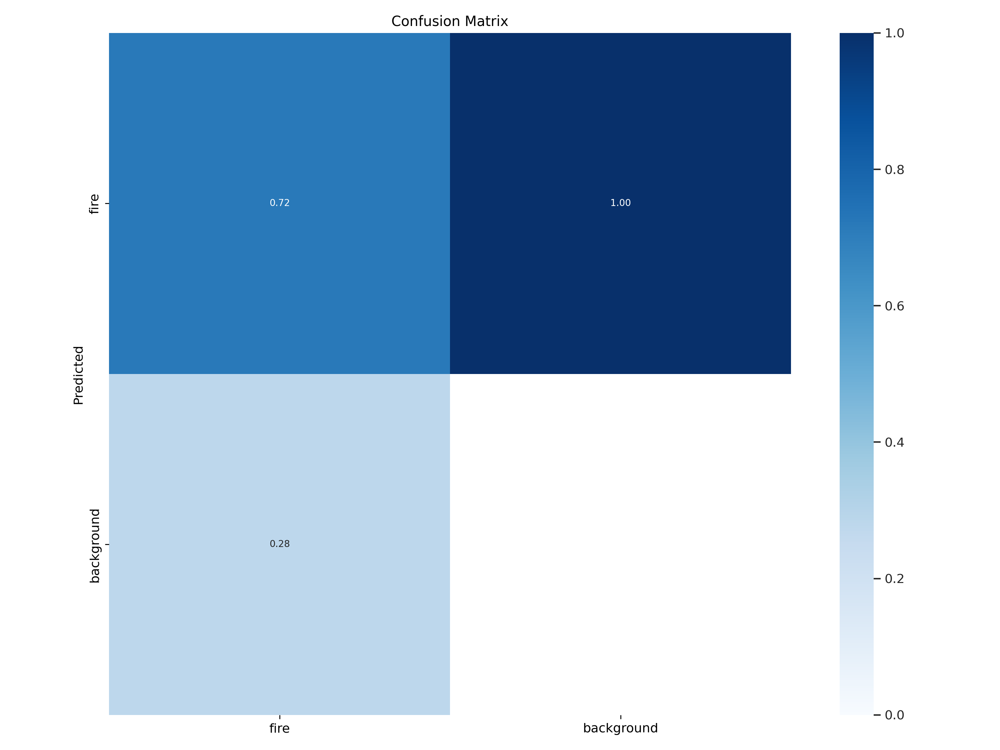

In [ ]:
# import numpy as np
# import cv2


# img = cv2.imread('confusion_matrix.png')
# from google.colab.patches import cv2_imshow
# cv2_imshow(img)


from IPython.display import Image
Image('confusion_matrix.png')

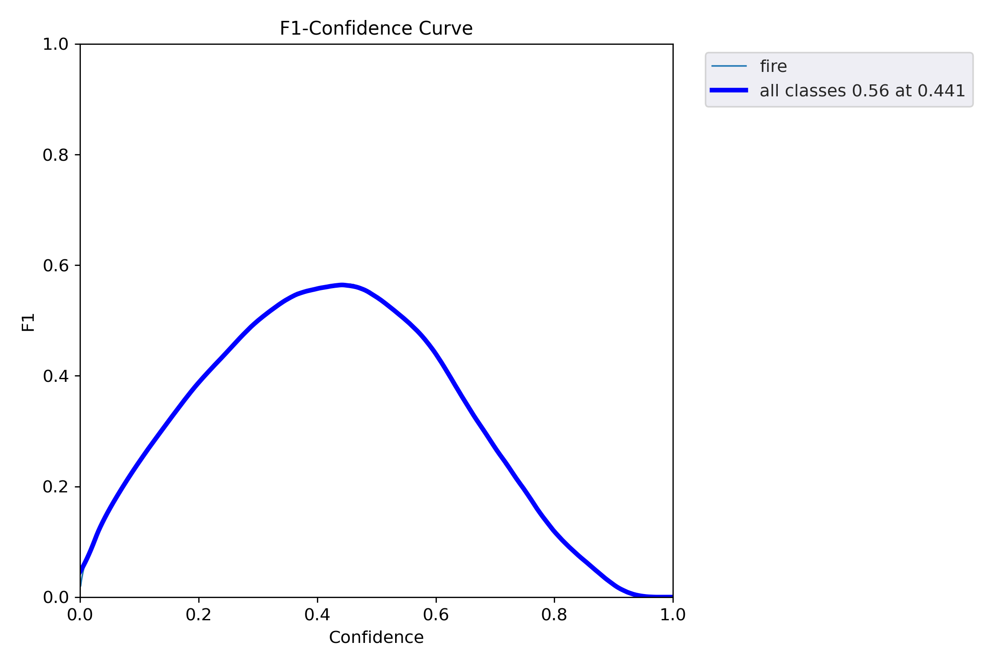

In [ ]:

# img = cv2.imread('F1_curve.png')
# cv2_imshow(img)

# import numpy as np
# import cv2


# img = cv2.imread('confusion_matrix.png')
# from google.colab.patches import cv2_imshow
# cv2_imshow(img)


from IPython.display import Image
Image('F1_curve.png')

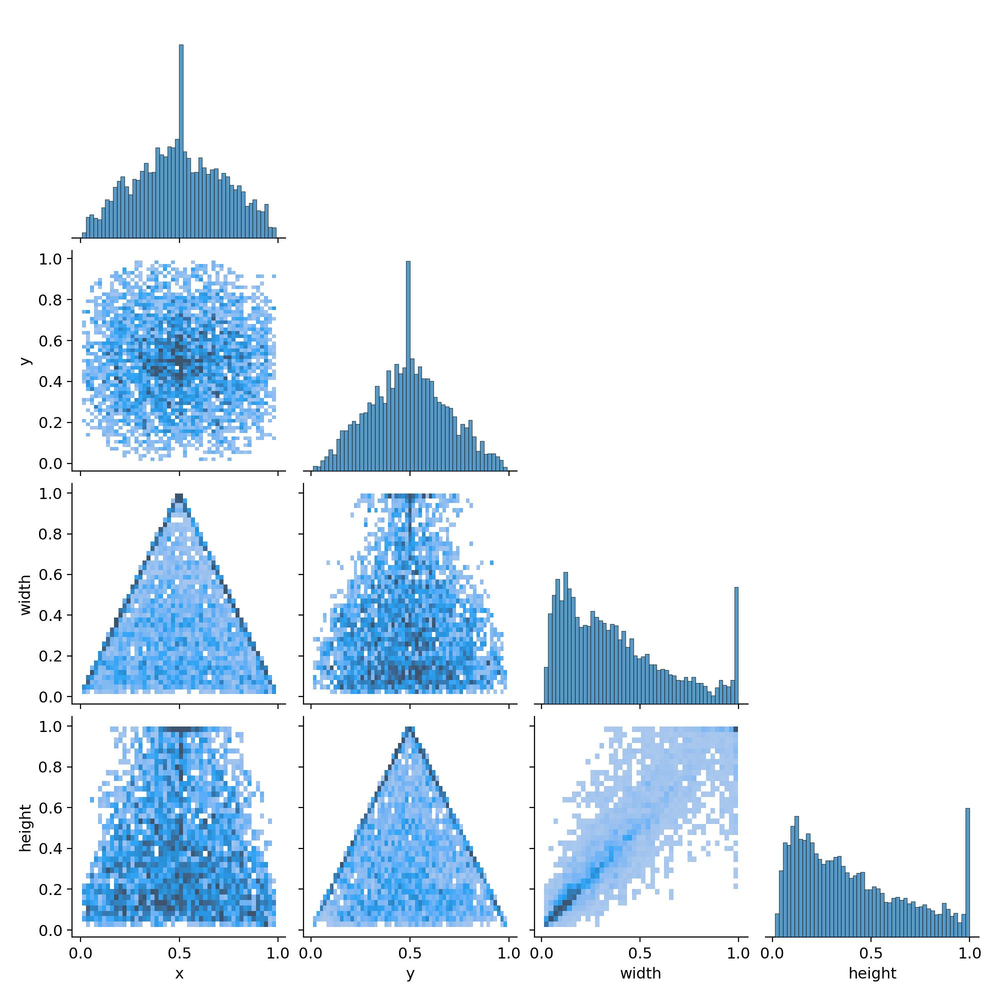

In [ ]:

# img = cv2.imread('labels_correlogram.jpg')
# cv2_imshow(img)

from IPython.display import Image
Image('labels_correlogram.jpg')

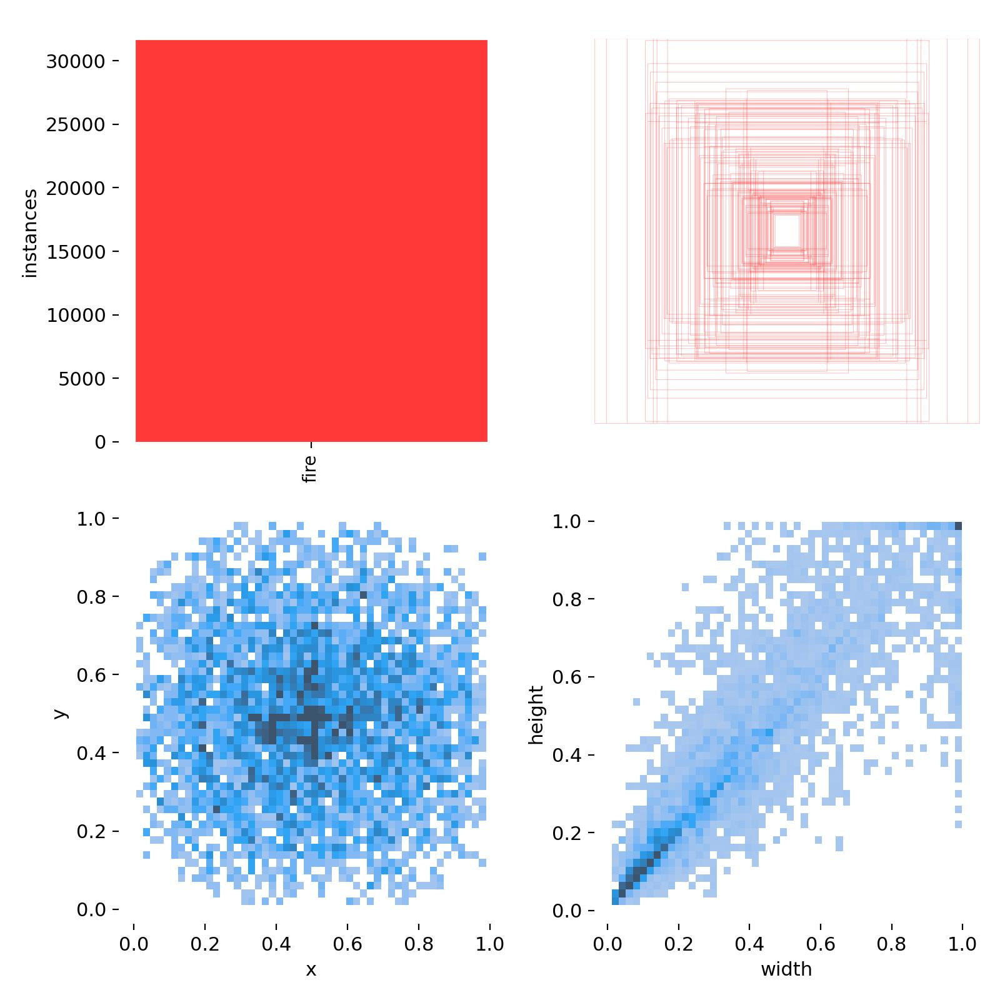

In [ ]:

from IPython.display import Image
Image('labels.jpg')

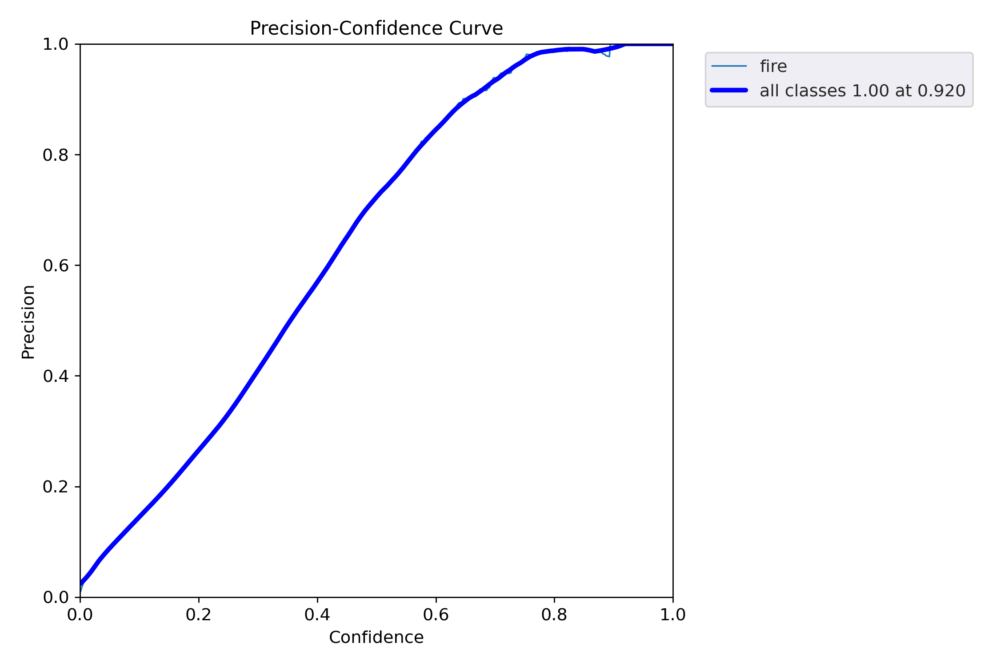

In [ ]:

# img = cv2.imread('P_curve.png')
# cv2_imshow(img)

from IPython.display import Image
Image('P_curve.png')

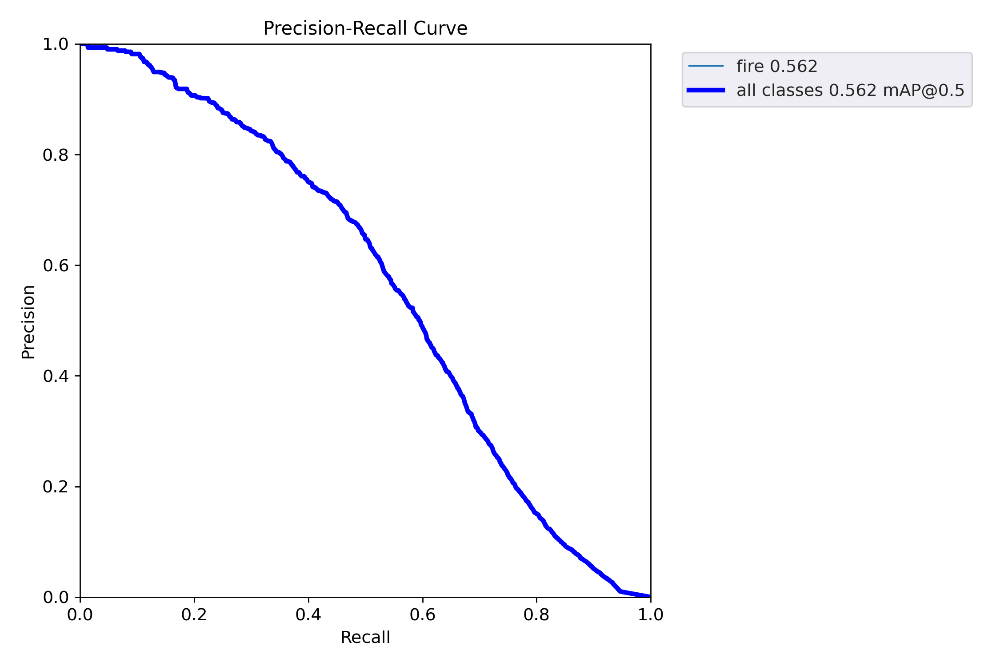

In [ ]:

from IPython.display import Image
Image('PR_curve.png')

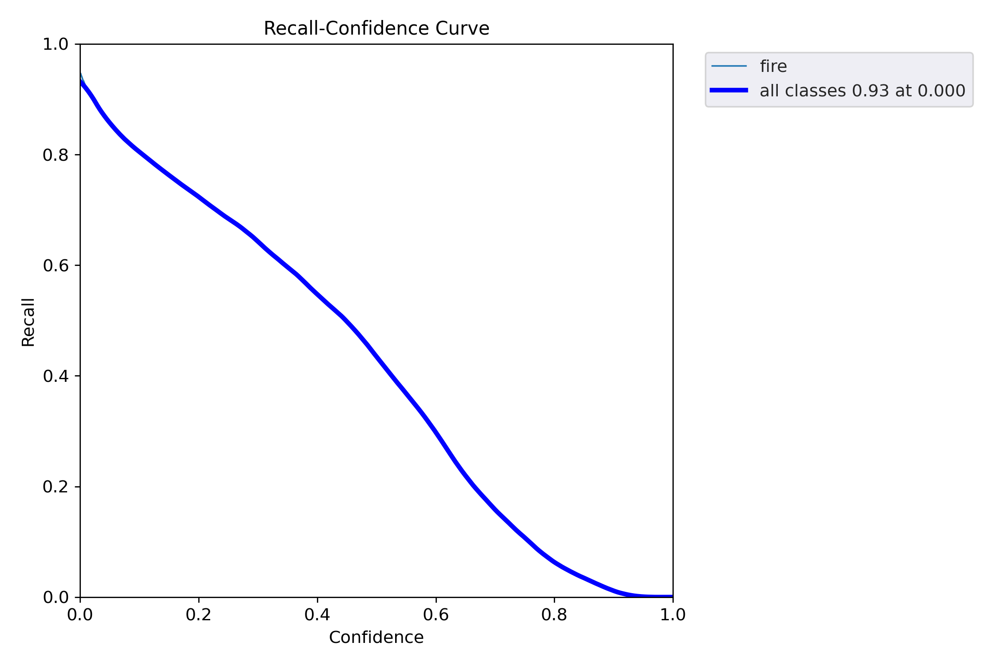

In [ ]:

from IPython.display import Image
Image('R_curve.png')
# img = cv2.imread('R_curve.png')
# cv2_imshow(img)

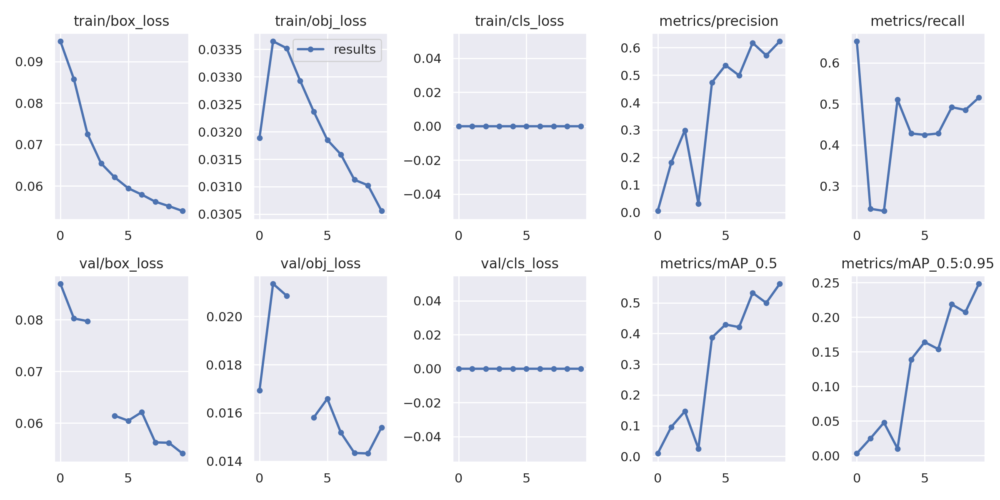

In [ ]:

# img = cv2.imread('results.png')
# cv2_imshow(img)

from IPython.display import Image
Image('results.png')

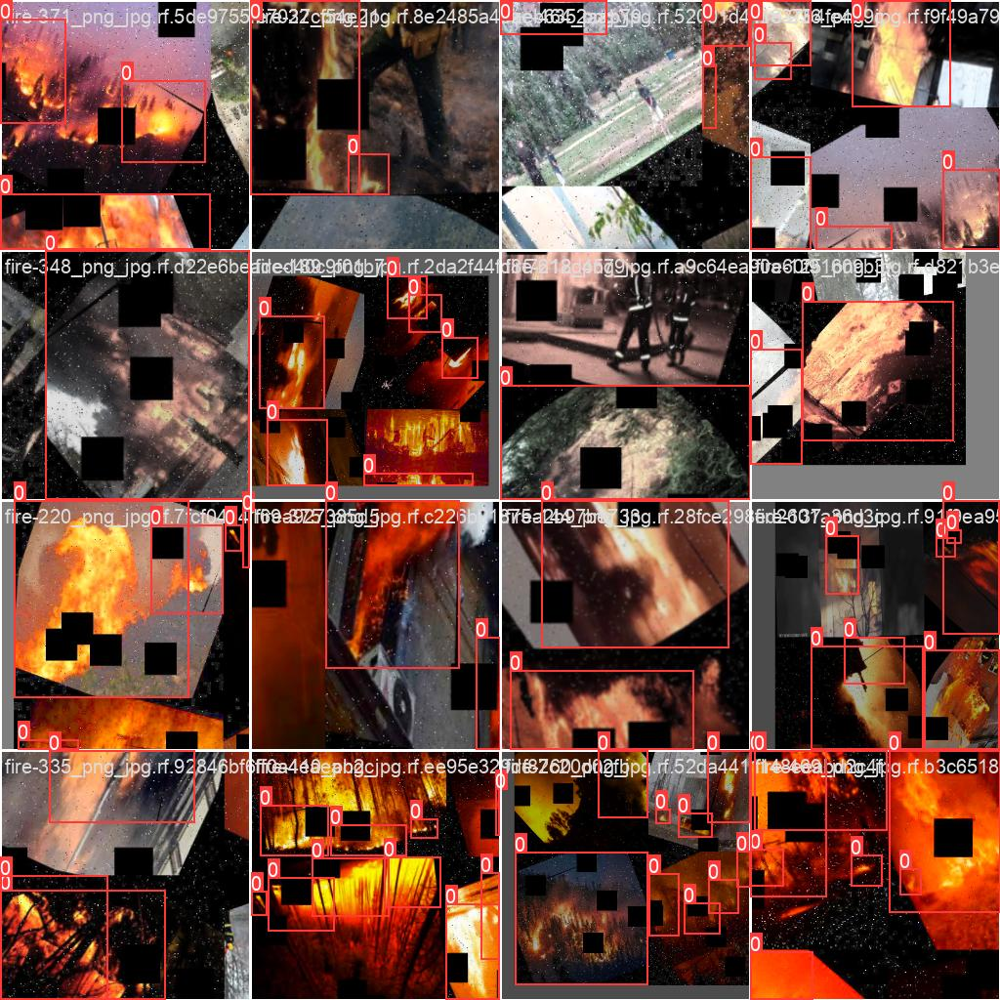

In [ ]:

# img = cv2.imread('train_batch0.jpg')
# cv2_imshow(img)

# img = cv2.imread('results.png')
# cv2_imshow(img)

from IPython.display import Image
Image('train_batch0.jpg')

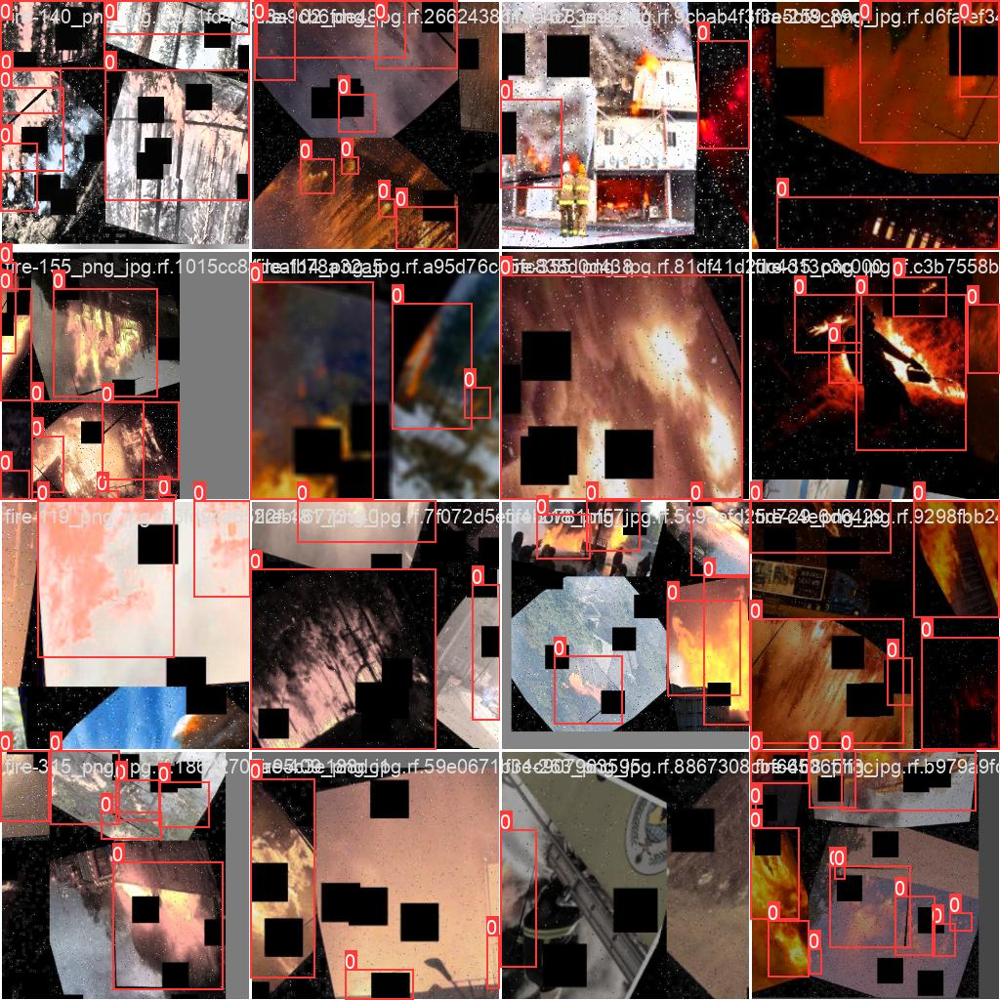

In [ ]:

# img = cv2.imread('train_batch1.jpg')
# cv2_imshow(img)


from IPython.display import Image
Image('train_batch1.jpg')

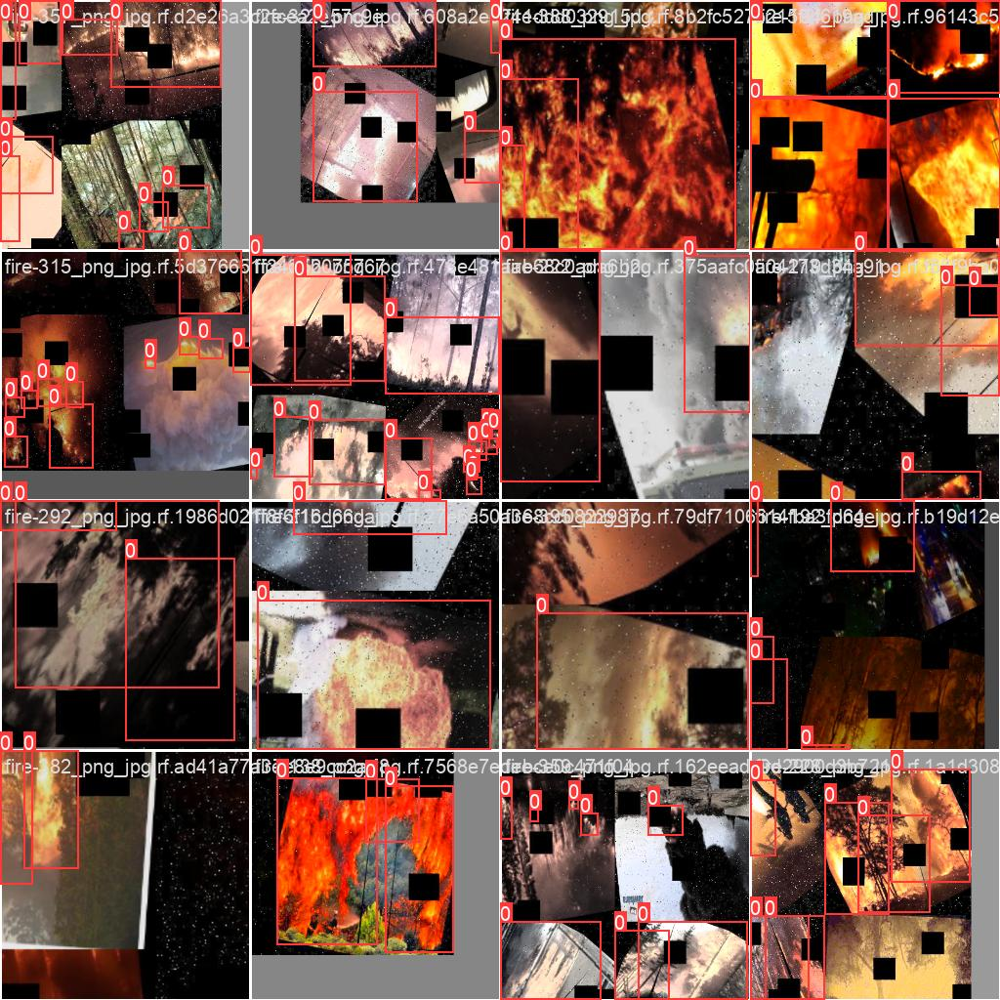

In [ ]:

from IPython.display import Image
Image('train_batch2.jpg')

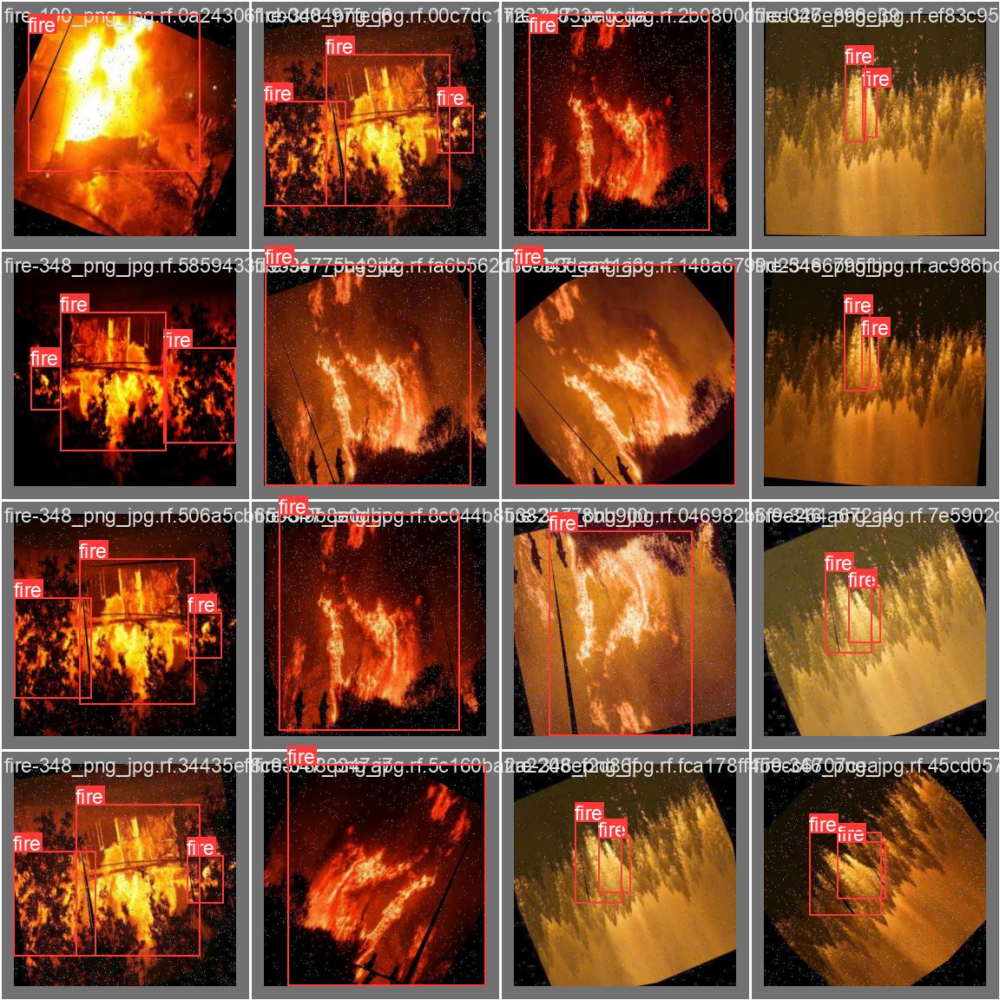

In [ ]:

Image('val_batch0_labels.jpg')


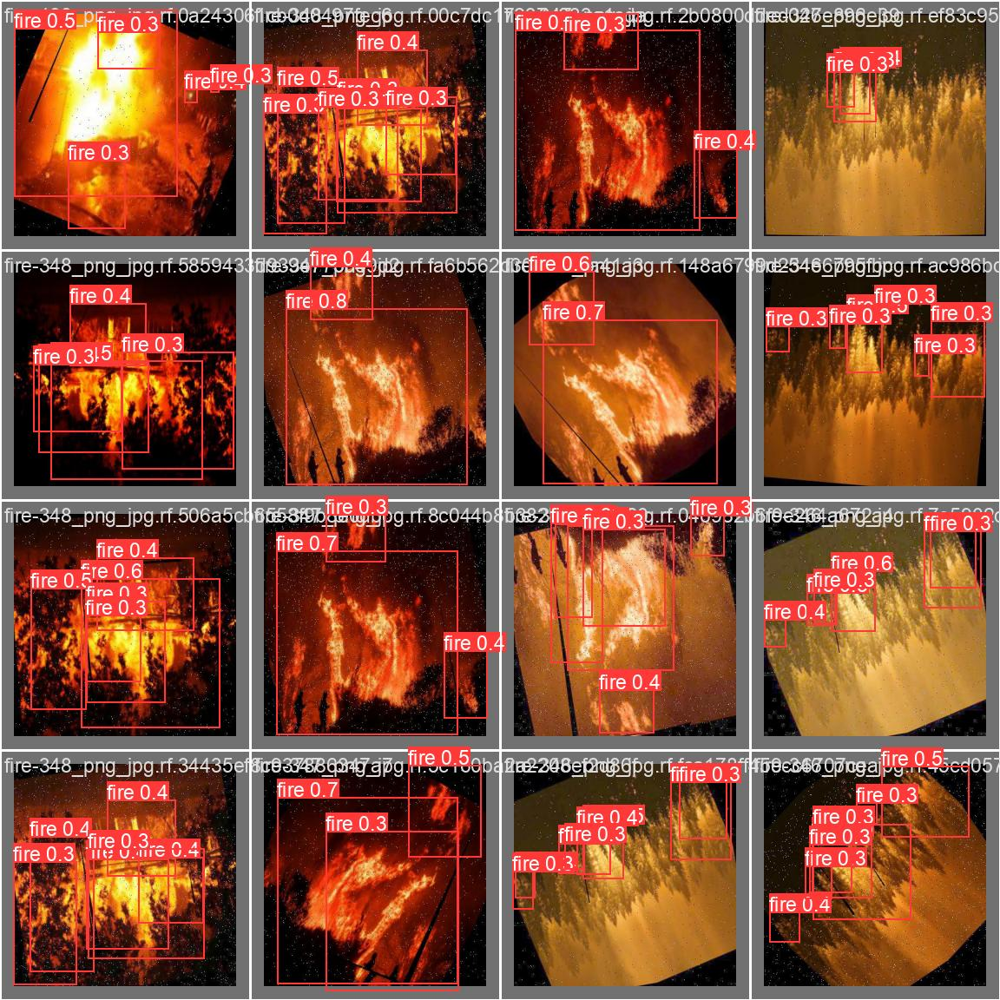

In [ ]:

Image('val_batch0_pred.jpg')


# RGB+INFRARED

In [ ]:
%cd /content

/content


In [ ]:
!ls

sample_data  yolov5


In [ ]:
!rm -rf rgb_infrared

In [ ]:

!mkdir rgb_infrared
%cd rgb_infrared
!pwd

/content/rgb_infrared
/content/rgb_infrared


In [ ]:
import cv2
import matplotlib.pyplot as plt
import glob
from google.colab import drive

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 14461, done.
remote: Counting objects: 100% (90/90), done.
remote: Compressing objects: 100% (49/49), done.
remote: Total 14461 (delta 58), reused 63 (delta 40), pack-reused 14371
Receiving objects: 100% (14461/14461), 13.57 MiB | 19.14 MiB/s, done.
Resolving deltas: 100% (9959/9959), done.
/content/rgb_infrared/yolov5


In [ ]:
#V2
!curl -L "https://app.roboflow.com/ds/lKOnuCwhuN?key=w4D87x46sd" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

# Already downloaded this dataset
!curl -L "https://universe.roboflow.com/ds/2nNJ36KvT1?key=kLR9mab3AY" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

# Thermal Images infrared for fire and smoke (using this dataset to augment with normal images thus learning will be for Infrared + Normal)
!curl -L "https://universe.roboflow.com/ds/PiUp5Cy0YP?key=voAEB9Pbbf" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip


In [ ]:
!pwd

/content/rgb_infrared/yolov5


In [ ]:
!ls

benchmarks.py	 export.py	      README.zh-CN.md	tutorial.ipynb
CITATION.cff	 hubconf.py	      requirements.txt	utils
classify	 LICENSE	      segment		valid
CONTRIBUTING.md  models		      setup.cfg		val.py
data		 README.dataset.txt   test
data.yaml	 README.md	      train
detect.py	 README.roboflow.txt  train.py


In [ ]:
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 1
names: ['Foc']

In [ ]:
# define number of classes based on YAML
# data.yaml contains the information about number of classes and their labels required for this project
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
# Below we are changing the data configuration for right path to the dataset
%%writetemplate data.yaml

train: ./train/images
val: ./valid/images

nc: 1
names: ['fire']

In [ ]:

%cat data.yaml


train: ./train/images
val: ./valid/images

nc: 1
names: ['fire']


In [ ]:
with open(r'data.yaml') as file:
    # The FullLoader parameter handles the conversion from YAML
    # scalar values to Python the dictionary format
    labels_list = yaml.load(file, Loader=yaml.FullLoader)

    label_names = labels_list['names']

In [ ]:
print("Number of Classes are {}, whose labels are {} for this Object Detection project".format(num_classes,label_names))


Number of Classes are 1, whose labels are ['fire'] for this Object Detection project


In [ ]:
!ls

benchmarks.py	 export.py	      README.zh-CN.md	tutorial.ipynb
CITATION.cff	 hubconf.py	      requirements.txt	utils
classify	 LICENSE	      segment		valid
CONTRIBUTING.md  models		      setup.cfg		val.py
data		 README.dataset.txt   test
data.yaml	 README.md	      train
detect.py	 README.roboflow.txt  train.py


In [ ]:
#this is the model configuration we will use for our tutorial 
# yolov5s.yaml contains the configuration of neural network required for training.
# /content/gdrive/MyDrive/Rachana_Bhankur/yolo_v5_project/yolov5_new/src/yolov5/data.yaml
# %cat /content/gdrive/MyDrive/yolov5_new/src/yolov5/models/yolov5s.yaml
%cat models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [ ]:
!ls

benchmarks.py	 export.py	      README.zh-CN.md	tutorial.ipynb
CITATION.cff	 hubconf.py	      requirements.txt	utils
classify	 LICENSE	      segment		valid
CONTRIBUTING.md  models		      setup.cfg		val.py
data		 README.dataset.txt   test
data.yaml	 README.md	      train
detect.py	 README.roboflow.txt  train.py


In [ ]:
%cd models

/content/rgb_infrared/yolov5/models


In [ ]:
!ls

common.py	 hub	      segment  yolo.py	     yolov5m.yaml  yolov5s.yaml
experimental.py  __init__.py  tf.py    yolov5l.yaml  yolov5n.yaml  yolov5x.yaml


In [ ]:
# skip this if you have already downloaded the file (best parameters)
!wget https://github.com/nv-thang/Forest-Fire-Detection-YOLOv5/raw/main/models/best.pt

--2022-12-12 02:57:21--  https://github.com/nv-thang/Forest-Fire-Detection-YOLOv5/raw/main/models/best.pt
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/nv-thang/Forest-Fire-Detection-YOLOv5/main/models/best.pt [following]
--2022-12-12 02:57:21--  https://raw.githubusercontent.com/nv-thang/Forest-Fire-Detection-YOLOv5/main/models/best.pt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 14813389 (14M) [application/octet-stream]
Saving to: ‘best.pt’

best.pt             100%[===================>]  14.13M  --.-KB/s    in 0.04s   

2022-12-12 02:57:22 (388 MB/s) - ‘best.pt’ saved [14813389/14813

In [ ]:
%cd ..

/content/rgb_infrared/yolov5


In [ ]:
!pwd

/content/rgb_infrared/yolov5


In [ ]:
%%time

!python train.py --img 240 --batch 160 --epochs 10 --data './data.yaml' --cfg ./models/yolov5s.yaml --weights ''

train: weights=, cfg=./models/yolov5s.yaml, data=./data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=160, imgsz=240, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-30-g342fe05 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (A100-SXM4-40GB, 40536MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s

In [ ]:
# Finding the dataset size

!pwd

/content/rgb_infrared/yolov5


In [ ]:
!ls

benchmarks.py	 detect.py    README.dataset.txt   segment	   utils
CITATION.cff	 export.py    README.md		   setup.cfg	   valid
classify	 hubconf.py   README.roboflow.txt  test		   val.py
CONTRIBUTING.md  LICENSE      README.zh-CN.md	   train
data		 models       requirements.txt	   train.py
data.yaml	 __pycache__  runs		   tutorial.ipynb


In [ ]:
import os

print(len(os.listdir('train/images/')))

14583


In [ ]:
import os

print(len(os.listdir('test/images/')))

692


In [ ]:
!ls

benchmarks.py	 detect.py    README.dataset.txt   segment	   utils
CITATION.cff	 export.py    README.md		   setup.cfg	   valid
classify	 hubconf.py   README.roboflow.txt  test		   val.py
CONTRIBUTING.md  LICENSE      README.zh-CN.md	   train
data		 models       requirements.txt	   train.py
data.yaml	 __pycache__  runs		   tutorial.ipynb


In [ ]:
!pwd

/content/rgb_infrared/yolov5


In [ ]:
!ls

benchmarks.py	 detect.py    README.dataset.txt   segment	   utils
CITATION.cff	 export.py    README.md		   setup.cfg	   valid
classify	 hubconf.py   README.roboflow.txt  test		   val.py
CONTRIBUTING.md  LICENSE      README.zh-CN.md	   train
data		 models       requirements.txt	   train.py
data.yaml	 __pycache__  runs		   tutorial.ipynb


Evaluate Custom YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the --name flag when we train. In our case, we named this yolov5s_results. (If given no name, it defaults to results.txt.) The results file is plotted as a png after training completes.

Partially completed results.txt files can be plotted with from utils.utils import plot_results; plot_results()

In [ ]:
# Start tensorboard
# Launch after you have started training to all the graphs needed for inspection
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

Curious? Visualize Our Training Data with Labels
After training starts, view train*.jpg images to see training images, labels and augmentation effects.

Note a mosaic dataloader is used for training (shown below), a new dataloading concept developed by Glenn Jocher and first featured in YOLOv4.

In [ ]:
# Please look to the new notebook for visuals!

In [ ]:
!pwd

!ls

/content/rgb_infrared/yolov5
benchmarks.py	 detect.py    README.dataset.txt   segment	   utils
CITATION.cff	 export.py    README.md		   setup.cfg	   valid
classify	 hubconf.py   README.roboflow.txt  test		   val.py
CONTRIBUTING.md  LICENSE      README.zh-CN.md	   train
data		 models       requirements.txt	   train.py
data.yaml	 __pycache__  runs		   tutorial.ipynb


In [ ]:
%cd runs

/content/rgb_infrared/yolov5/runs


In [ ]:
!ls

train


In [ ]:
%cd train

/content/rgb_infrared/yolov5/runs/train


In [ ]:
!ls

exp


In [ ]:
%cd exp

/content/rgb_infrared/yolov5/runs/train/exp


In [ ]:
!ls

confusion_matrix.png				   results.png
events.out.tfevents.1670813848.3b6f765db5eb.761.0  train_batch0.jpg
F1_curve.png					   train_batch1.jpg
hyp.yaml					   train_batch2.jpg
labels_correlogram.jpg				   val_batch0_labels.jpg
labels.jpg					   val_batch0_pred.jpg
opt.yaml					   val_batch1_labels.jpg
P_curve.png					   val_batch1_pred.jpg
PR_curve.png					   val_batch2_labels.jpg
R_curve.png					   val_batch2_pred.jpg
results.csv					   weights


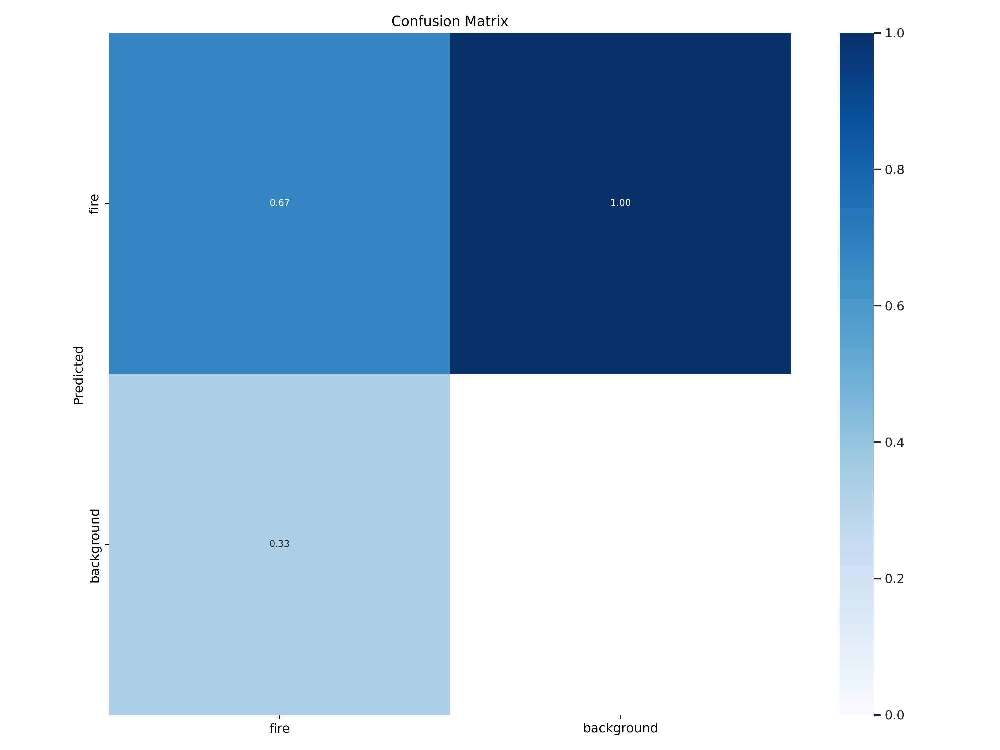

In [ ]:
Image('confusion_matrix.png')


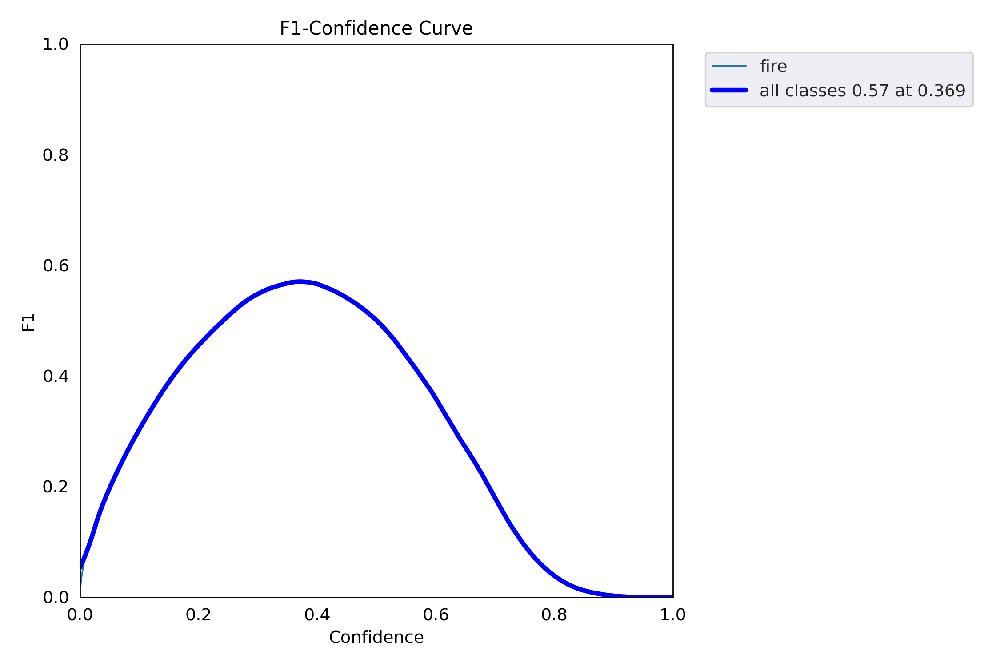

In [ ]:
Image('F1_curve.png')

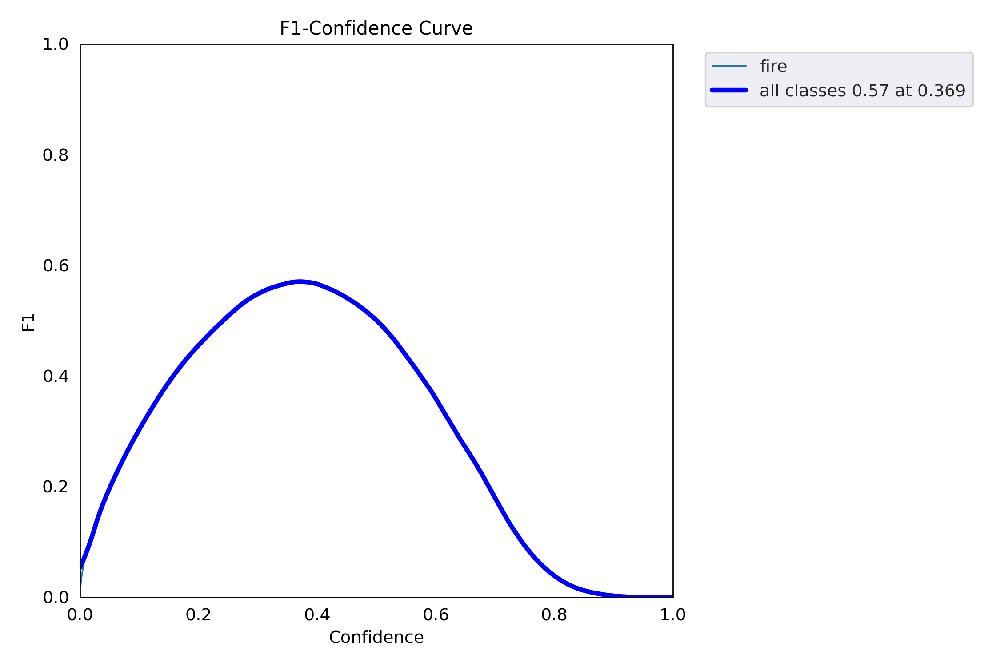

In [ ]:
Image('F1_curve.png')

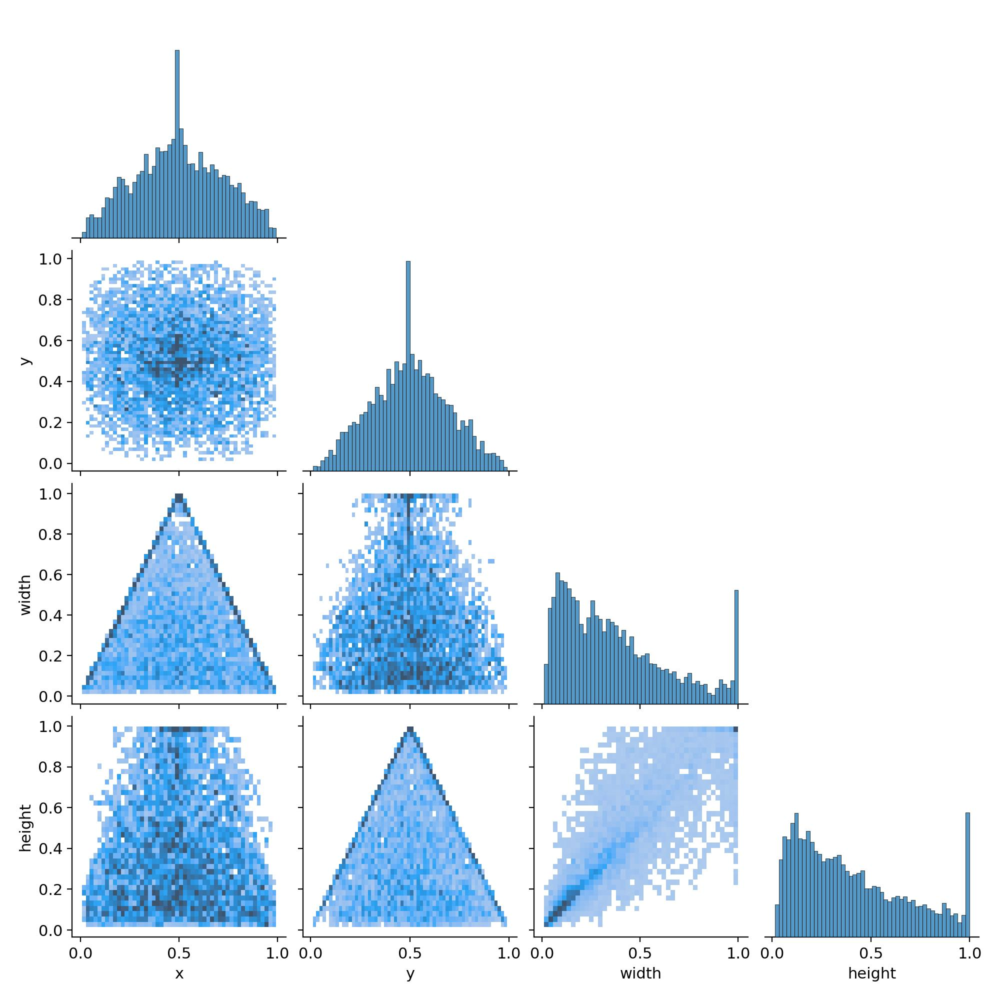

In [ ]:
Image('labels_correlogram.jpg')

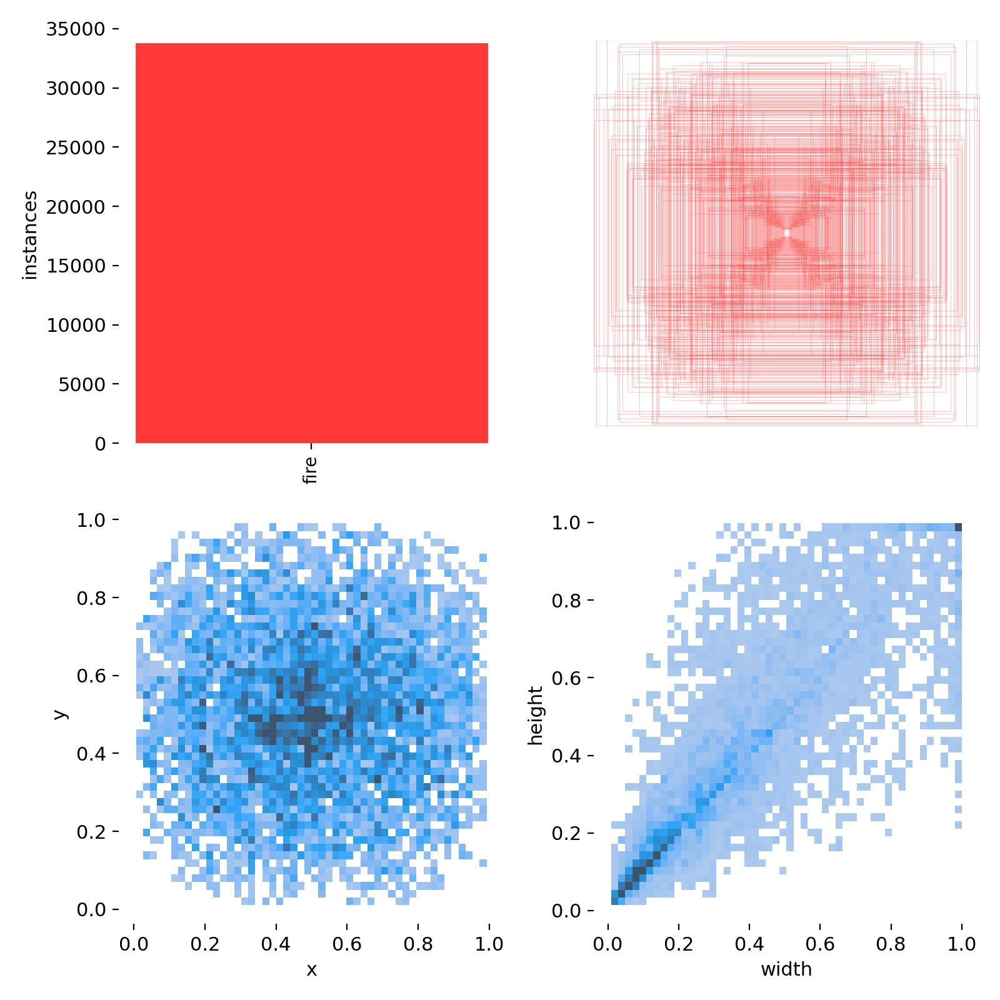

In [ ]:
Image('labels.jpg')

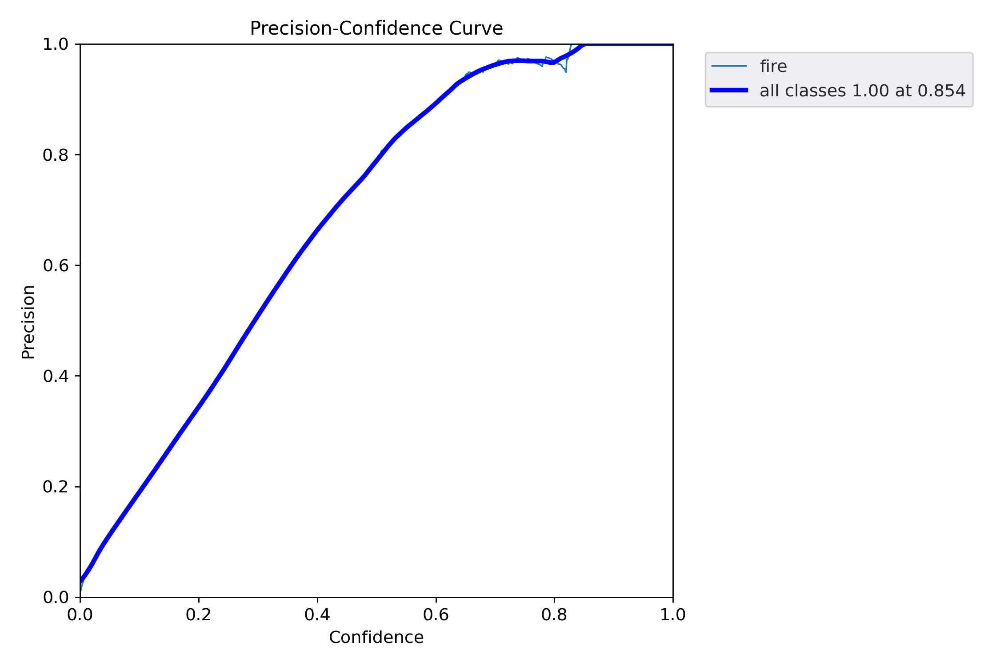

In [ ]:
Image('P_curve.png')

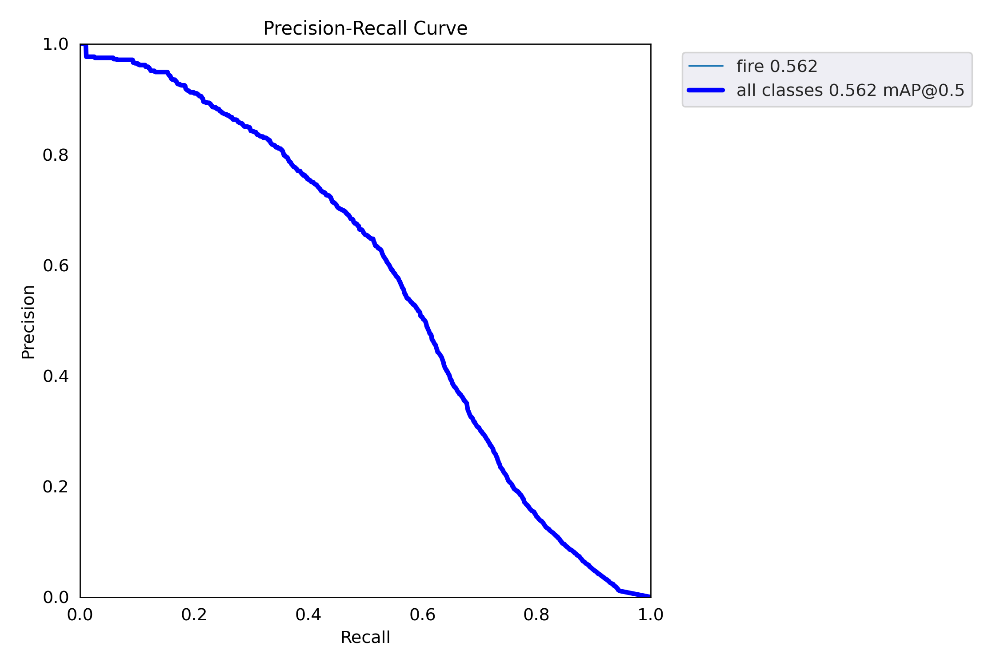

In [ ]:
Image('PR_curve.png')

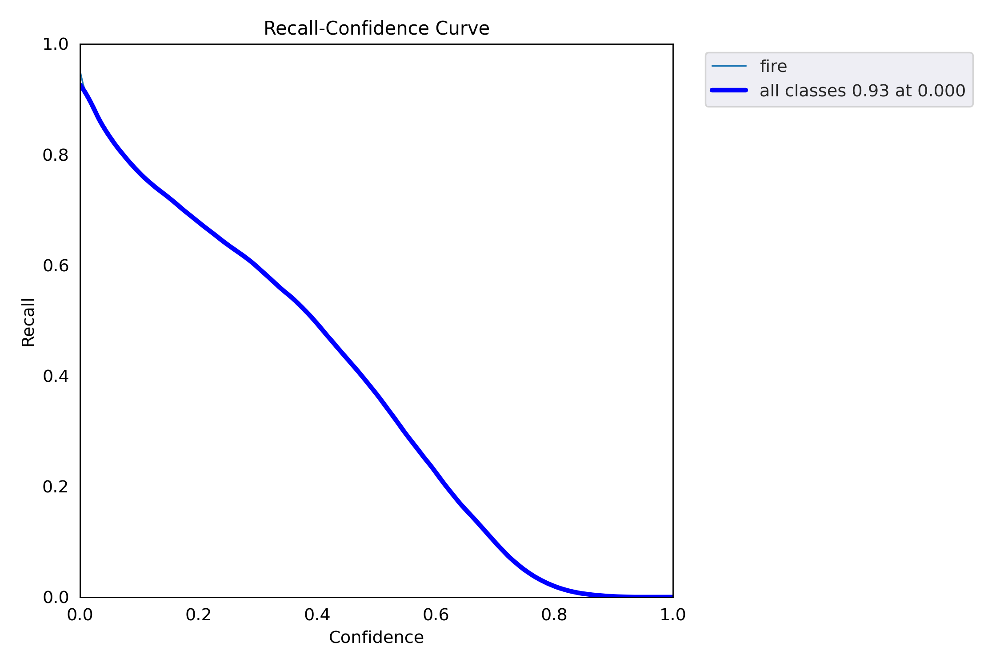

In [ ]:
Image('R_curve.png')

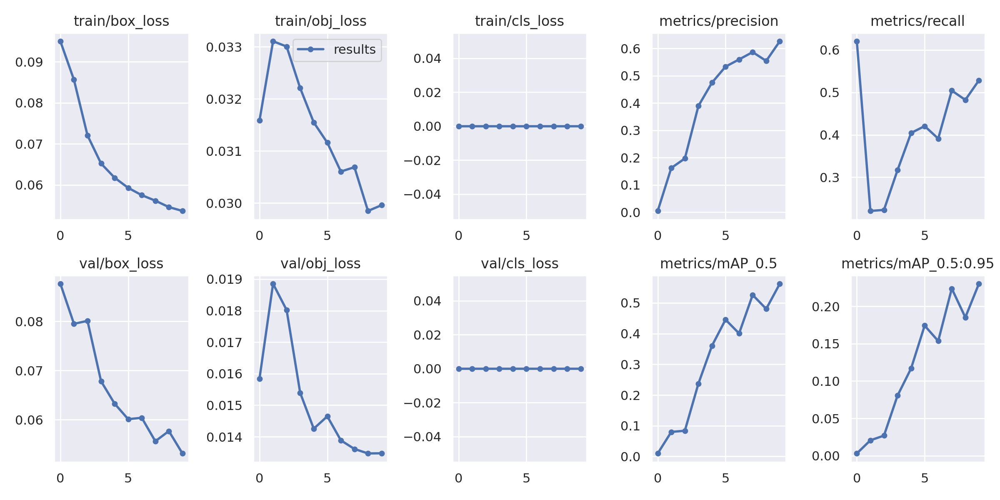

In [ ]:
Image('results.png')

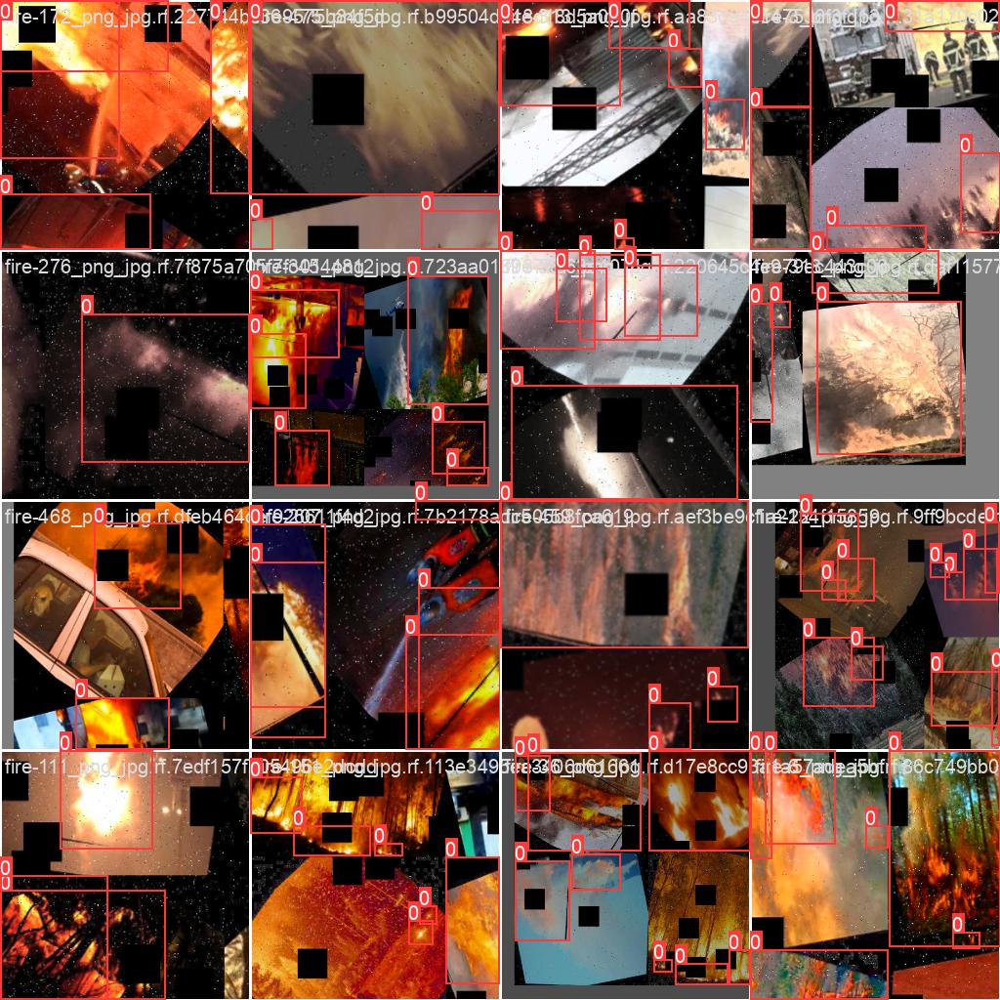

In [ ]:
Image('train_batch0.jpg')

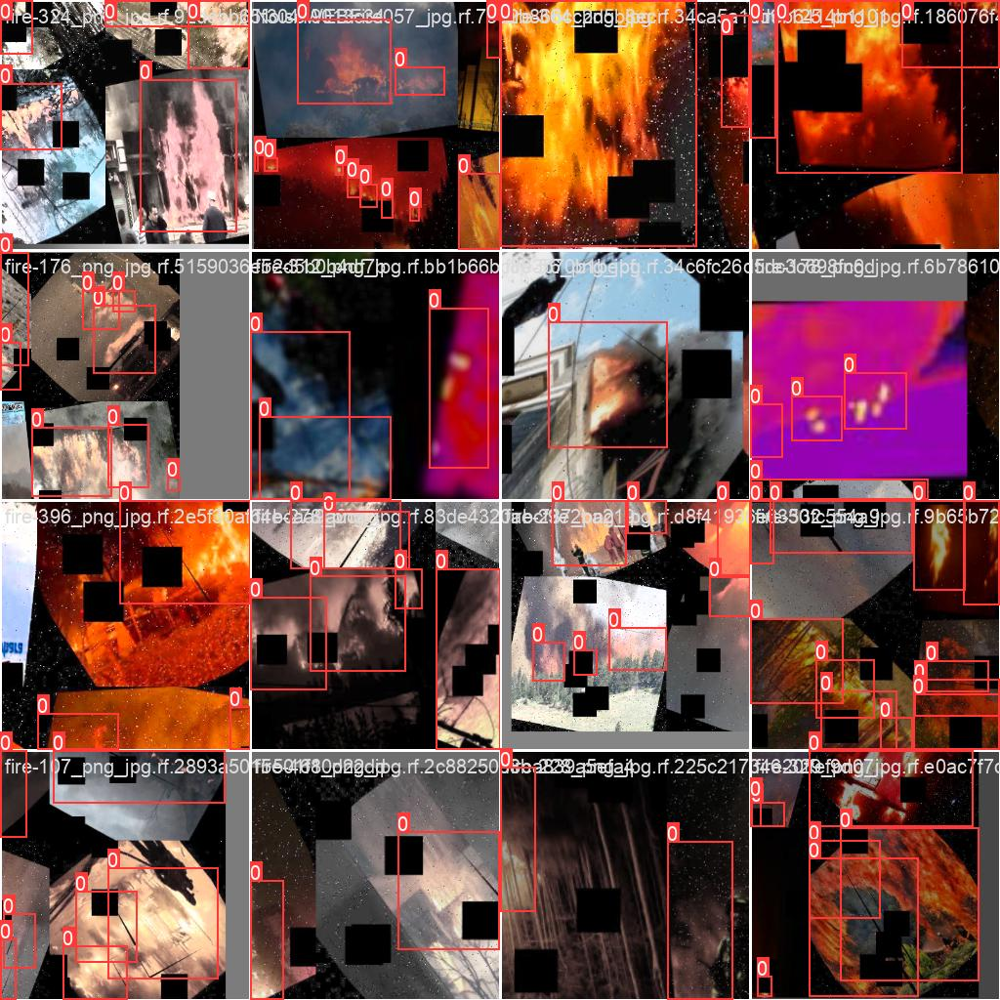

In [ ]:
Image('train_batch1.jpg')

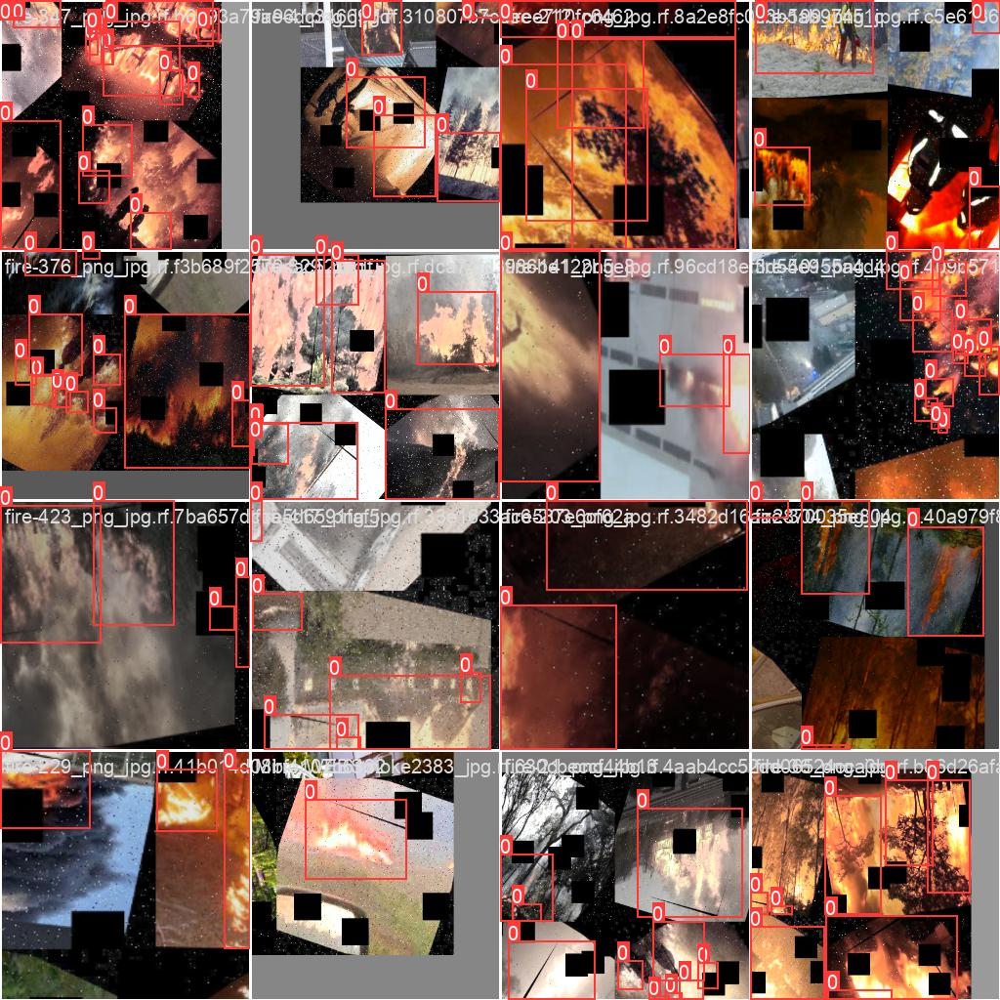

In [ ]:
Image('train_batch2.jpg')

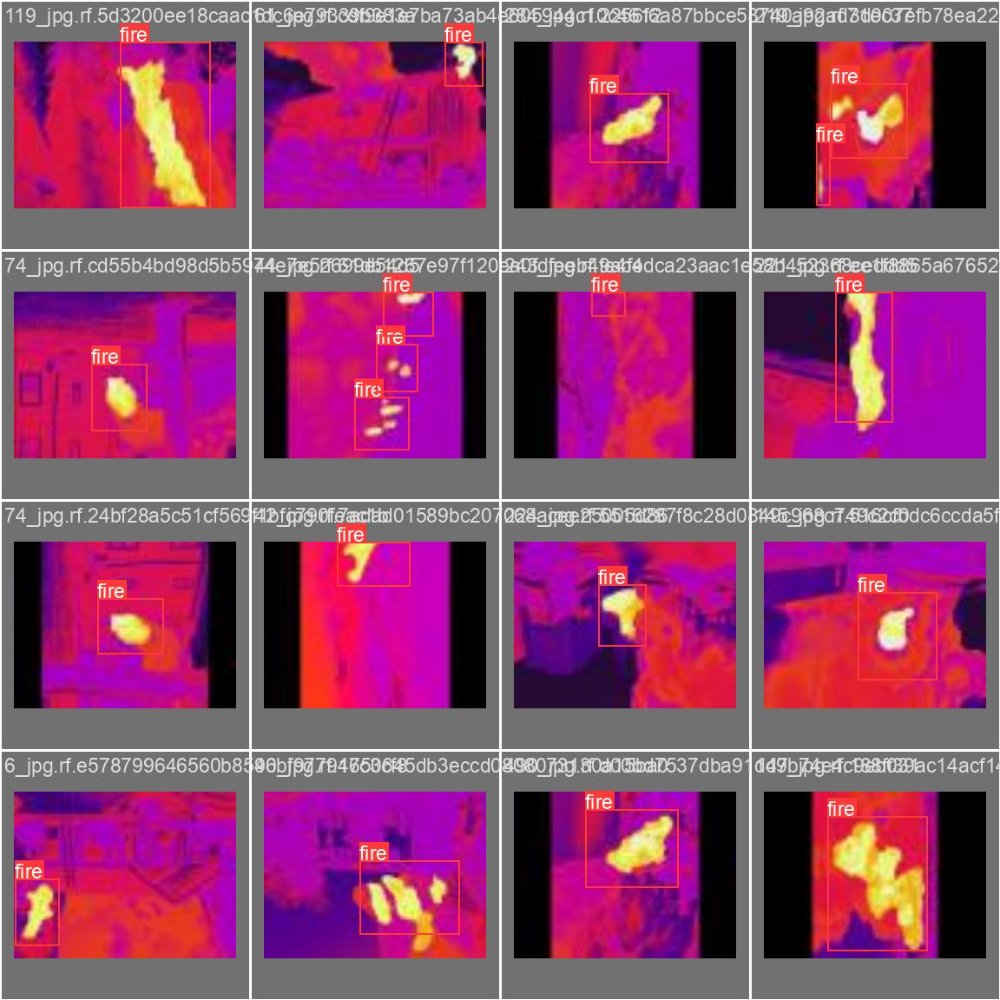

In [ ]:
Image('val_batch0_labels.jpg')

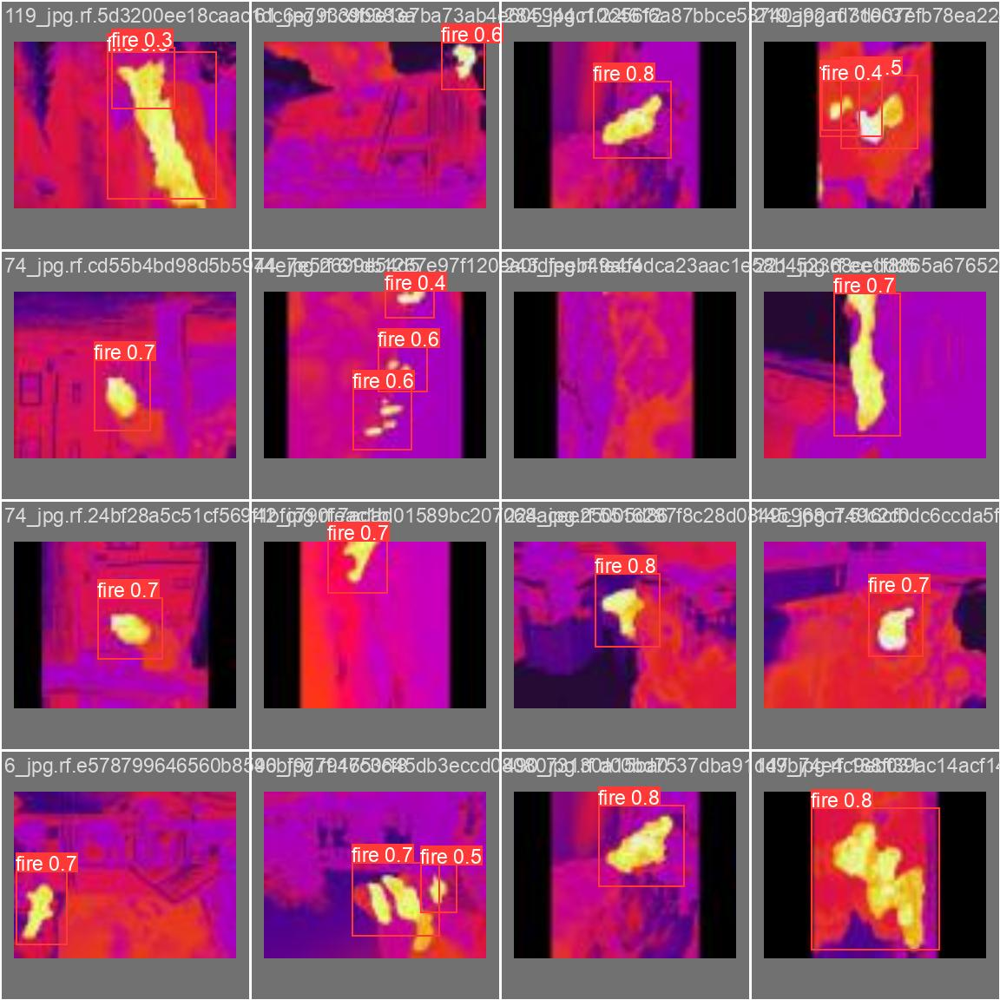

In [ ]:
Image('val_batch0_pred.jpg')

# Changing Hyperparameters:

- Learning rate

- Batch

- Image scaling